# Reverse Toy Example

In [1]:
import sys, importlib, os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torchvision.utils
from typing import Tuple
import yaml
from pathlib import Path
from datetime import datetime

In [4]:
# Importing project packages
cwd = Path(os.getcwd())
root_dir = cwd.parent

utils_dir = root_dir.joinpath('src','utils')
weights_dir = root_dir.joinpath('checkpoints','weights')
model_dir = root_dir.joinpath('src','model')
yaml_file_path = root_dir.joinpath('experiments','base_config.yaml')
lightning_model = root_dir.joinpath('src', 'training')


# Making packages importable
sys.path.append(str(root_dir))

In [8]:
from src.utils import WIP_SDE, WIP_processes
from src.models import unet_model, components
from src.models import unet_model


importlib.reload(WIP_SDE)
importlib.reload(WIP_processes)
importlib.reload(components)
importlib.reload(unet_model)
# importlib.reload(LDMLightningModule)

UNet = unet_model.UNet
from src.utils.WIP_SDE import VESDE, SubVPSDE, VPSDE
from src.utils.WIP_processes import Diffusion_Processes
from src.training.ldm_module import LDMLightningModule
from src.models.components import SinusoidalPositionEmbeddings # Required by unet_model
#from src.models.unet_model import UNet

# Weights to test

In [9]:
weights_name = "DM_final_T1000_LR0001_E3_GMM_ts20251218_223753.pth"

# Test

In [23]:
# Match your training cfg
test_cfg = {
    'N': 1000,
    'sde_type': 'vp', # or 've' / 'subvp'
    'channels': 4,    # Vital: Match your blob channel count
    'image_size': 32,
    'features': [128, 256, 512],
    'batch_size': 16,
    'vae_scale_factor': 0.18125,
    'learning_rate': 0.001,
    'channels': 4
}

device = "cpu"

hparams = {
        'learning_rate': test_cfg['learning_rate'],
        'n_timesteps': test_cfg['N'],
        'batch_size': test_cfg['batch_size'],
        'vae_scale_factor': test_cfg['vae_scale_factor']
    }

In [26]:
# 1. Instantiate the module as you did in setup()
# Note: You need to provide the same hparams/cfg used in training
unet_model = UNet(
        in_channels=test_cfg['channels'], 
        out_channels=test_cfg['channels'], 
        features=test_cfg['features']
    ).to(device)

ldm_module = LDMLightningModule(
    unet_model=unet_model, 
    diffusion_process=Diffusion_Processes(test_cfg),
    vae_encoder = None,
    vae_decoder = None,
    hparams=hparams,
    cfg=test_cfg
)

# 2. Load the raw state dict
checkpoint = torch.load(f"../checkpoints/weights/{weights_name}", map_location=device)
ldm_module.load_state_dict(checkpoint['state_dict'])

model = ldm_module.unet.eval().to(device)

This is our SDE: <src.utils.WIP_SDE.VPSDE object at 0x0000020B96D82F60>
This is the value of T: 1.0
Check prior vp: Mean = -0.0018436972750350833, Std = 0.9993772506713867
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00025558657944202423, std drift: 0.011092159897089005
Diffusion: mean diff 0.14135099947452545, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.001329874969087541, std_difference = 0.14237813651561737
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.000245866016484797, std drift: 0.011066175997257233
Diffusion: mean diff 0.14128059148788452, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0009764857240952551, std_difference = 0.14215397834777832
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00024831449263729155, std drift: 0.01104089617729187
Diffusion: mean diff 0.14121012389659882, std diff: 0.0
Update: mean differ

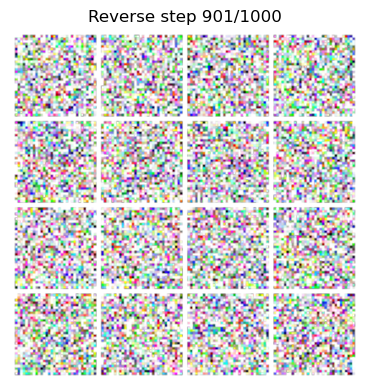

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002695905859582126, std drift: 0.009080803953111172
Diffusion: mean diff 0.1341271847486496, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00035503244725987315, std_difference = 0.13381867110729218
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0002689665707293898, std drift: 0.009058081544935703
Diffusion: mean diff 0.13405297696590424, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0008705968502908945, std_difference = 0.13465772569179535
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00026784802321344614, std drift: 0.009044918231666088
Diffusion: mean diff 0.1339787393808365, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.001037590904161334, std_difference = 0.13420461118221283
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean

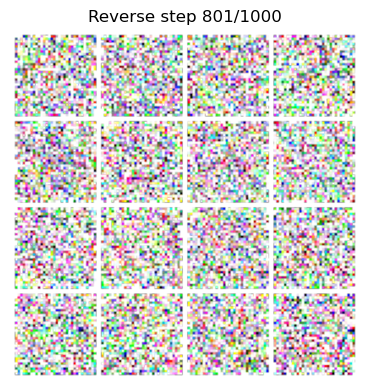

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003508420195430517, std drift: 0.00729789212346077
Diffusion: mean diff 0.1264915019273758, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00018860040290746838, std_difference = 0.1264517605304718
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003492593241389841, std drift: 0.007274985313415527
Diffusion: mean diff 0.12641282379627228, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.00014797583571635187, std_difference = 0.12706132233142853
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0003493438125588, std drift: 0.0072576445527374744
Diffusion: mean diff 0.126334086060524, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0009275205666199327, std_difference = 0.12681974470615387
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean dr

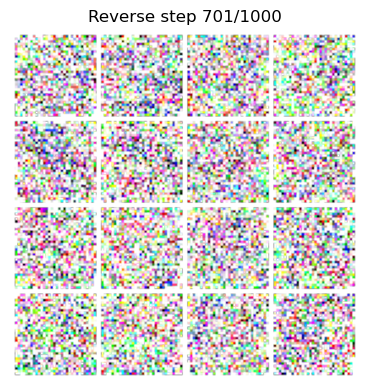

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0004583337577059865, std drift: 0.0055931429378688335
Diffusion: mean diff 0.11836427450180054, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.000836576393339783, std_difference = 0.11831420660018921
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00045626057544723153, std drift: 0.005576941184699535
Diffusion: mean diff 0.11828017979860306, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.0004558652872219682, std_difference = 0.11824911832809448
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00045847048750147223, std drift: 0.005559220910072327
Diffusion: mean diff 0.1181960254907608, std diff: 1.538985294757822e-08
Update: mean difference (x_new - x_prev): mean_difference = 0.0002476346562616527, std_difference = 0.1179022341966629
This is the current dt: 0.001
Stati

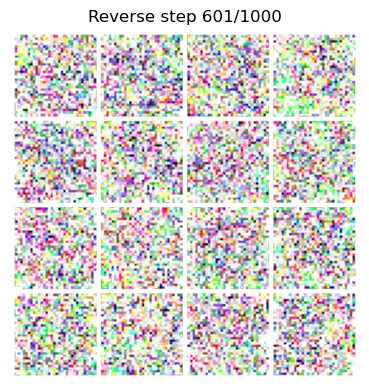

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005861278623342514, std drift: 0.004299398977309465
Diffusion: mean diff 0.10963623225688934, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.0009132219711318612, std_difference = 0.10969146341085434
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005885669961571693, std drift: 0.004286850802600384
Diffusion: mean diff 0.10954545438289642, std diff: 1.538985294757822e-08
Update: mean difference (x_new - x_prev): mean_difference = 0.0010878584580495954, std_difference = 0.11000899225473404
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0005905446014367044, std drift: 0.004275304730981588
Diffusion: mean diff 0.10945456475019455, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0014233612455427647, std_difference = 0.10959023237228394
This is the current dt: 0.001
Stati

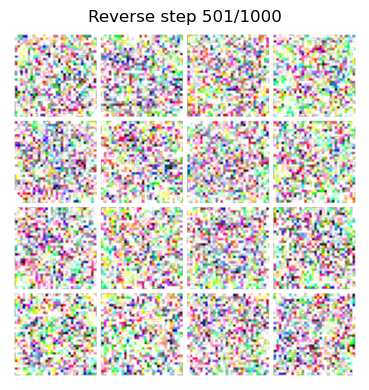

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007207469316199422, std drift: 0.003587256418541074
Diffusion: mean diff 0.10015039891004562, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0004296263214200735, std_difference = 0.09994031488895416
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007216419326141477, std drift: 0.003584947669878602
Diffusion: mean diff 0.10005099326372147, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0011079848045483232, std_difference = 0.10036451369524002
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007235707598738372, std drift: 0.003581916680559516
Diffusion: mean diff 0.09995149821043015, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0008289183024317026, std_difference = 0.10063842684030533
This is the current dt: 0.001
Statistics for each timestep:
Drift: mea

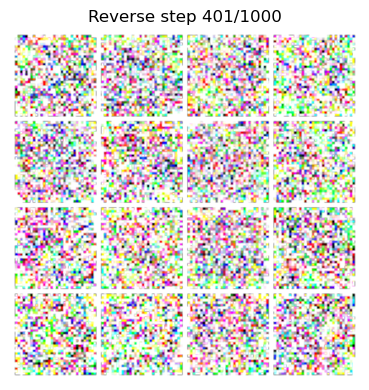

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.000786402786616236, std drift: 0.0033858218230307102
Diffusion: mean diff 0.08966660499572754, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0007429303368553519, std_difference = 0.08984589576721191
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.000786968448664993, std drift: 0.0033838239032775164
Diffusion: mean diff 0.08955556899309158, std diff: 7.69492647378911e-09
Update: mean difference (x_new - x_prev): mean_difference = 0.0007097333436831832, std_difference = 0.09001830220222473
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007866667583584785, std drift: 0.003382399445399642
Diffusion: mean diff 0.08944440633058548, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0009214592864736915, std_difference = 0.08951815217733383
This is the current dt: 0.001
Statistics for each tim

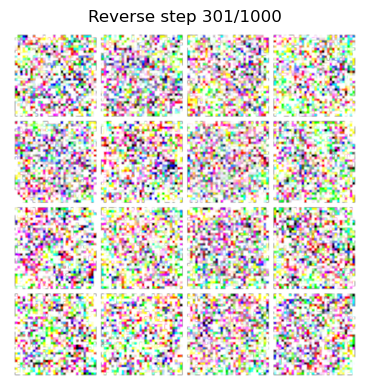

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007092922460287809, std drift: 0.0031375472899526358
Diffusion: mean diff 0.07778239250183105, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00018192459538113326, std_difference = 0.07809055596590042
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00070713966852054, std drift: 0.0031331514474004507
Diffusion: mean diff 0.07765436917543411, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00022511824499815702, std_difference = 0.07753992825746536
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0007061273790895939, std drift: 0.003128953045234084
Diffusion: mean diff 0.07752612978219986, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.00010811856191139668, std_difference = 0.07777100056409836
This is the current dt: 0.001
Statistics for each timestep:
Drift: 

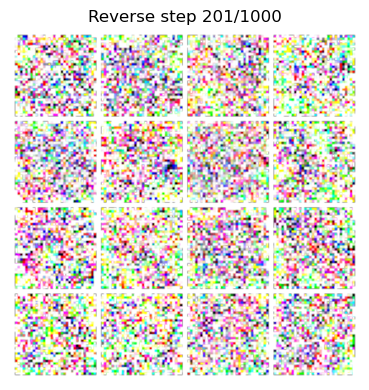

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0004390253743622452, std drift: 0.002789912046864629
Diffusion: mean diff 0.06371891498565674, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0003127765085082501, std_difference = 0.06375464051961899
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.0004349004593677819, std drift: 0.0027878277469426394
Diffusion: mean diff 0.06356257200241089, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0007182635017670691, std_difference = 0.06368505209684372
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift -0.00043098386959172785, std drift: 0.002786975121125579
Diffusion: mean diff 0.063405841588974, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 0.0005631161038763821, std_difference = 0.06358412653207779
This is the current dt: 0.001
Statistics for each timestep:
Drift: mea

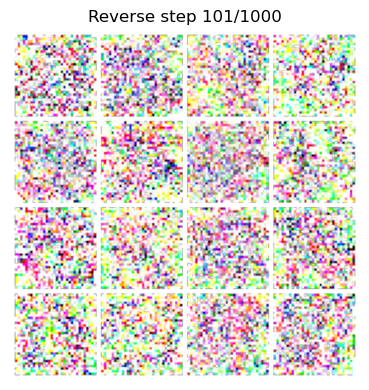

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 7.586519132019021e-06, std drift: 0.0032213691156357527
Diffusion: mean diff 0.04549834877252579, std diff: 3.847463236894555e-09
Update: mean difference (x_new - x_prev): mean_difference = 8.458107913611457e-05, std_difference = 0.045737795531749725
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 1.2642172805499285e-05, std drift: 0.0032314718700945377
Diffusion: mean diff 0.04527914151549339, std diff: 3.847463236894555e-09
Update: mean difference (x_new - x_prev): mean_difference = 4.0805116441333666e-05, std_difference = 0.04555511474609375
This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 1.810440153349191e-05, std drift: 0.003241606056690216
Diffusion: mean diff 0.045058850198984146, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = 2.3821397917345166e-05, std_difference = 0.04521861672401428
This is the current dt: 0.001


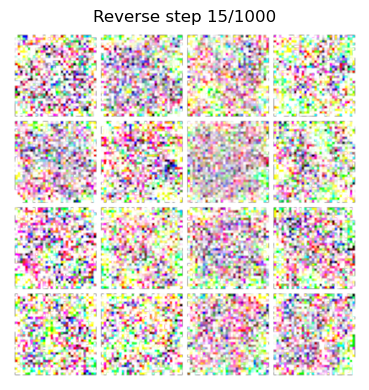

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0004769523802679032, std drift: 0.004469158127903938
Diffusion: mean diff 0.01893937774002552, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0006377532845363021, std_difference = 0.019521351903676987
[reverse step 14/1000 | i=13 | t=0.0130]
mean=0.4669, std=2.1582, min=-22.3405, max=45.3822
Time of last 100 steps: 0.8176016807556152. Time remaining 80.94256639480591.



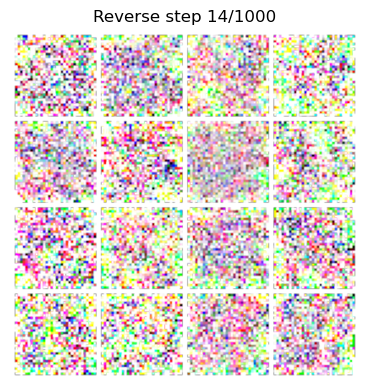

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0004845894582103938, std drift: 0.004506403114646673
Diffusion: mean diff 0.018406523391604424, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0005257074953988194, std_difference = 0.01898215338587761
[reverse step 13/1000 | i=12 | t=0.0120]
mean=0.4663, std=2.1547, min=-22.2978, max=45.3637
Time of last 100 steps: 0.9145491123199463. Time remaining 90.54036211967468.



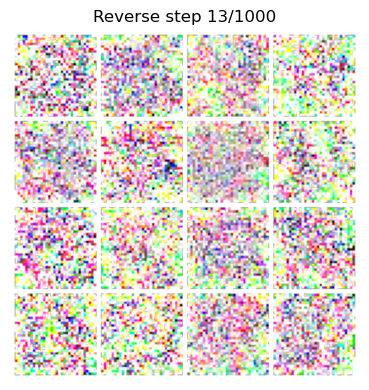

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.000495532585773617, std drift: 0.004548531025648117
Diffusion: mean diff 0.01785777322947979, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0005070288898423314, std_difference = 0.018451113253831863
[reverse step 12/1000 | i=11 | t=0.0110]
mean=0.4658, std=2.1511, min=-22.2645, max=45.3210
Time of last 100 steps: 0.8200743198394775. Time remaining 81.18735766410828.



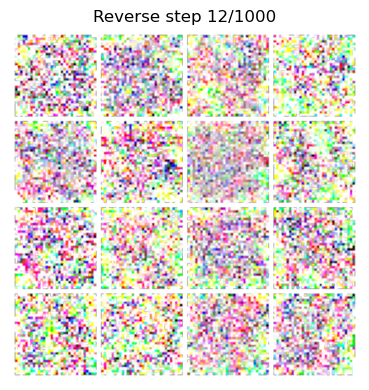

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005044307326897979, std drift: 0.004597776103764772
Diffusion: mean diff 0.017291618511080742, std diff: 1.9237316184472775e-09
Update: mean difference (x_new - x_prev): mean_difference = -0.0004621436819434166, std_difference = 0.017825298011302948
[reverse step 11/1000 | i=10 | t=0.0100]
mean=0.4654, std=2.1475, min=-22.2544, max=45.2751
Time of last 100 steps: 0.817699670791626. Time remaining 80.95226740837097.



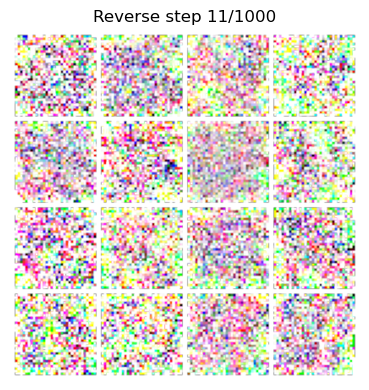

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005142851732671261, std drift: 0.004655970726162195
Diffusion: mean diff 0.01670628786087036, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0005788699490949512, std_difference = 0.017351394519209862
[reverse step 10/1000 | i=9 | t=0.0090]
mean=0.4648, std=2.1437, min=-22.2260, max=45.2483
Time of last 100 steps: 0.8638107776641846. Time remaining 86.38107776641846.



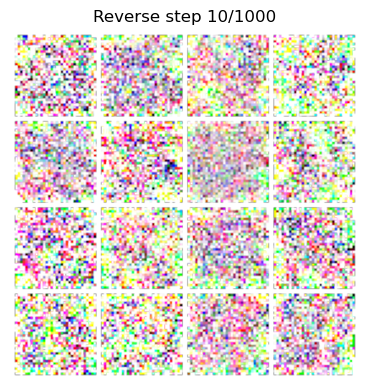

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005256530130282044, std drift: 0.004727024585008621
Diffusion: mean diff 0.01609969139099121, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.000498727080412209, std_difference = 0.01684444583952427
[reverse step 9/1000 | i=8 | t=0.0080]
mean=0.4643, std=2.1400, min=-22.2110, max=45.2237
Time of last 100 steps: 0.8623616695404053. Time remaining 86.23616695404053.



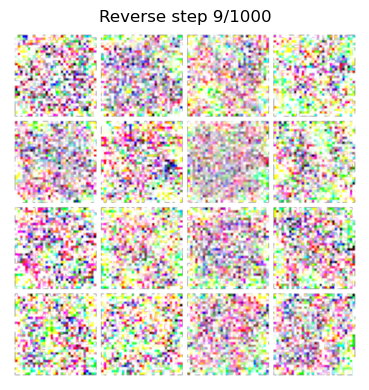

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005417015636339784, std drift: 0.004815604072064161
Diffusion: mean diff 0.015469326637685299, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0005340782226994634, std_difference = 0.016223754733800888
[reverse step 8/1000 | i=7 | t=0.0070]
mean=0.4638, std=2.1362, min=-22.2084, max=45.2053
Time of last 100 steps: 0.8313751220703125. Time remaining 83.13751220703125.



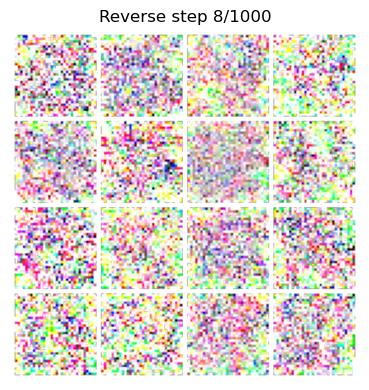

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005598115385510027, std drift: 0.004931087605655193
Diffusion: mean diff 0.014812157489359379, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0006097236764617264, std_difference = 0.015681974589824677
[reverse step 7/1000 | i=6 | t=0.0060]
mean=0.4632, std=2.1321, min=-22.1926, max=45.1506
Time of last 100 steps: 0.8288547992706299. Time remaining 82.88547992706299.



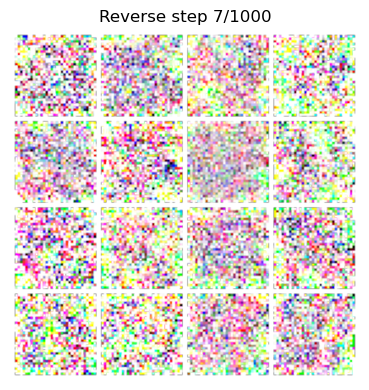

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0005822423263452947, std drift: 0.005089102312922478
Diffusion: mean diff 0.014124446548521519, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0005721879424527287, std_difference = 0.01494947075843811
[reverse step 6/1000 | i=5 | t=0.0050]
mean=0.4626, std=2.1280, min=-22.1836, max=45.0969
Time of last 100 steps: 0.8209924697875977. Time remaining 82.09924697875977.



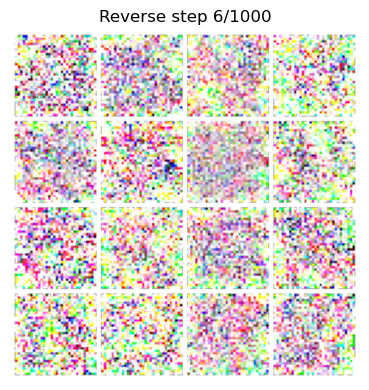

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0006143160862848163, std drift: 0.005319557152688503
Diffusion: mean diff 0.013401494361460209, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0006019992288202047, std_difference = 0.014379661530256271
[reverse step 5/1000 | i=4 | t=0.0040]
mean=0.4620, std=2.1237, min=-22.1779, max=45.0365
Time of last 100 steps: 0.8250846862792969. Time remaining 82.50846862792969.



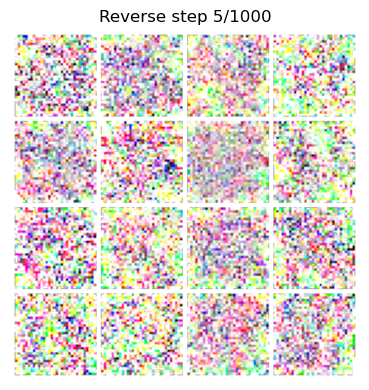

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0006645756075158715, std drift: 0.005687755066901445
Diffusion: mean diff 0.012637248262763023, std diff: 9.618658092236387e-10
Update: mean difference (x_new - x_prev): mean_difference = -0.0006077131256461143, std_difference = 0.013884508050978184
[reverse step 4/1000 | i=3 | t=0.0030]
mean=0.4614, std=2.1190, min=-22.1612, max=44.9837
Time of last 100 steps: 0.8894054889678955. Time remaining 88.94054889678955.



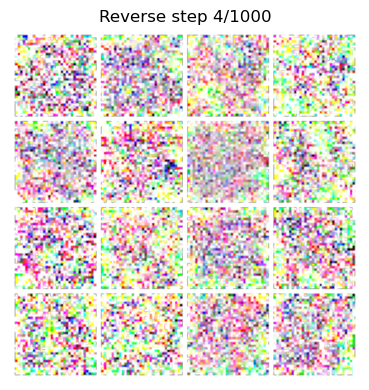

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0007517511839978397, std drift: 0.006370136048644781
Diffusion: mean diff 0.011823706328868866, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0008034613565541804, std_difference = 0.013437584042549133
[reverse step 3/1000 | i=2 | t=0.0020]
mean=0.4606, std=2.1139, min=-22.1408, max=44.9356
Time of last 100 steps: 0.8329143524169922. Time remaining 83.29143524169922.



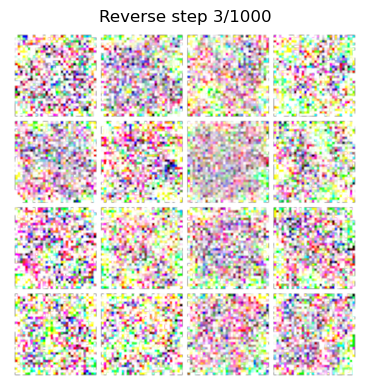

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 0.0009691582527011633, std drift: 0.008104609325528145
Diffusion: mean diff 0.010949886403977871, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -0.0009772840421646833, std_difference = 0.013622451573610306
[reverse step 2/1000 | i=1 | t=0.0010]
mean=0.4596, std=2.1073, min=-22.1101, max=44.8665
Time of last 100 steps: 0.8427138328552246. Time remaining 84.27138328552246.



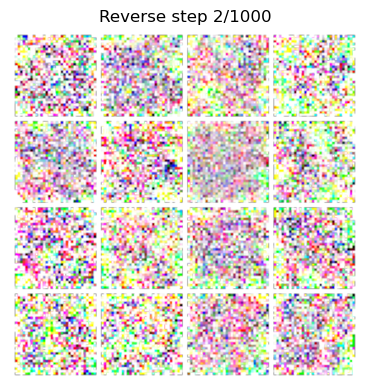

This is the current dt: 0.001
Statistics for each timestep:
Drift: mean drift 8.7352294921875, std drift: 71.66756439208984
Diffusion: mean diff 0.010000000707805157, std diff: 0.0
Update: mean difference (x_new - x_prev): mean_difference = -8.7352294921875, std_difference = 71.66756439208984
[reverse step 1/1000 | i=0 | t=0.0000]
mean=-8.2756, std=69.9319, min=-731.3456, max=454.6971
Time of last 100 steps: 0.8433334827423096. Time remaining 84.33334827423096.



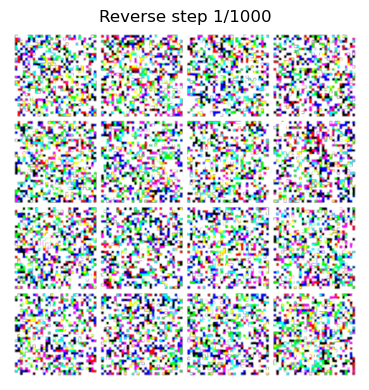

In [27]:
diffusion_manager = Diffusion_Processes(test_cfg)

# Sample from the model
samples = diffusion_manager.reverse_process(
    model=model,
    shape=(16, 4, 32, 32), # 16 samples, 4 channels
    probability_flow=False
)

In [32]:
import matplotlib.pyplot as plt
import torchvision
import torch

def visualize_gmm_samples(samples, test_cfg):
    """
    Visualizes multi-channel GMM samples both as an RGB composite 
    and as individual channel heatmaps.
    """
    # 1. RGB Composite Visualization (First 3 Channels)
    # This represents the mix of different GMM modes in a single view
    vis_rgb = samples[:, :3, :, :].detach().cpu()
    
    # Min-max normalization for display range [0, 1]
    vis_rgb = (vis_rgb - vis_rgb.min()) / (vis_rgb.max() - vis_rgb.min() + 1e-8)
    
    grid_rgb = torchvision.utils.make_grid(vis_rgb, nrow=4)
    plt.figure(figsize=(8, 8))
    plt.imshow(grid_rgb.permute(1, 2, 0))
    plt.title("RGB Composite: Combined GMM Modes")
    plt.axis("off")
    plt.show()

    # 2. Individual Channel Visualization
    # Iterates through each channel to show spatial distribution per mode
    for i in range(test_cfg['channels']):
        # Unsqueeze(1) converts (B, H, W) to (B, 1, H, W) for make_grid compatibility
        vis_chan = samples[:, i, :, :].unsqueeze(1).detach().cpu()
        
        # Normalization per channel to highlight the specific blob intensity
        vis_chan = (vis_chan - vis_chan.min()) / (vis_chan.max() - vis_chan.min() + 1e-8)
        
        grid_chan = torchvision.utils.make_grid(vis_chan, nrow=4)
        
        plt.figure(figsize=(8, 8))
        # Permute(1, 2, 0) moves channel to the last dimension for matplotlib
        # cmap="viridis" or "hot" is often better for single-channel heatmaps
        plt.imshow(grid_chan.permute(1, 2, 0).squeeze(), cmap="magma")
        plt.title(f"Channel {i}: Heatmap for GMM Mode {i}")
        plt.colorbar(label="Intensity")
        plt.axis("off")
        plt.show()

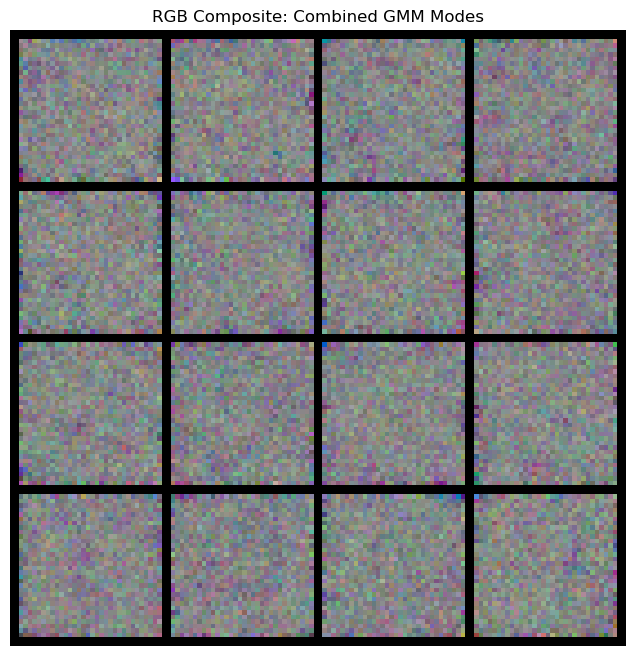

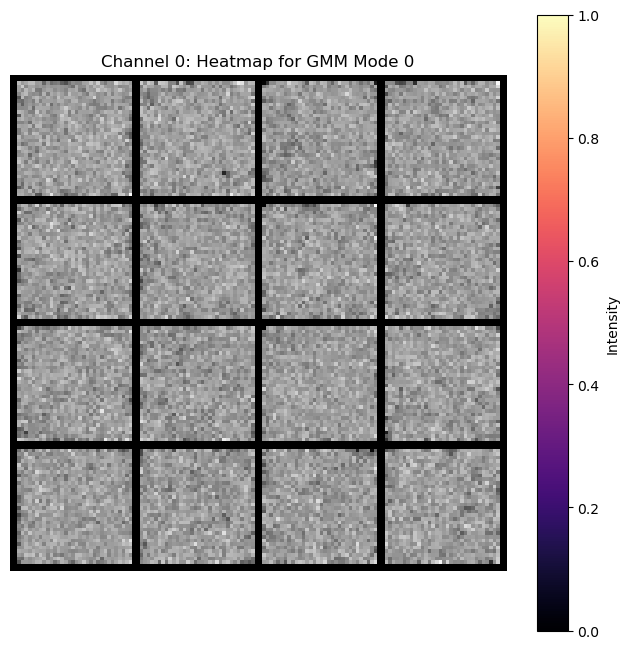

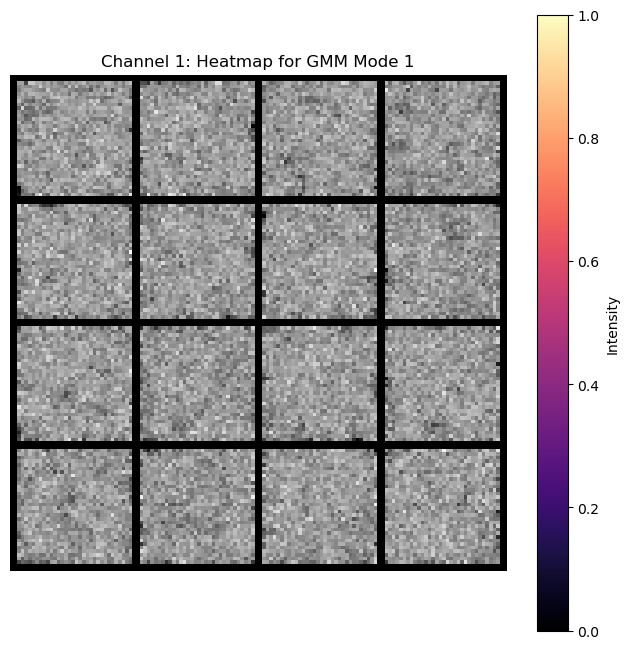

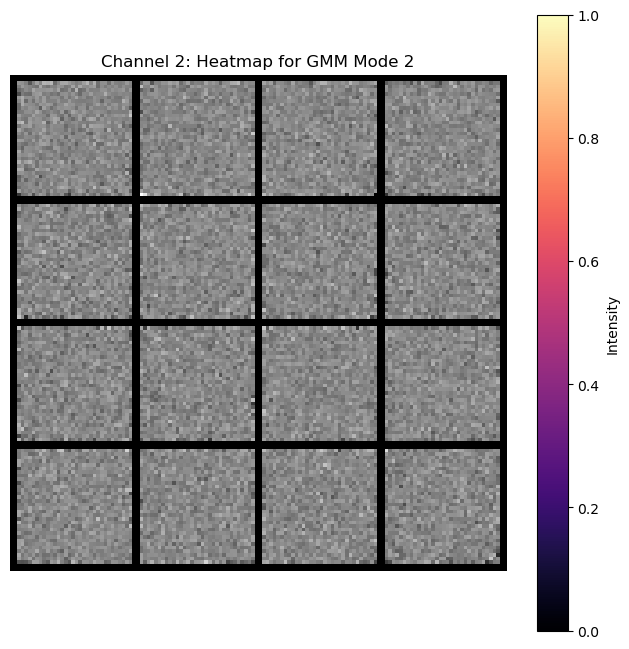

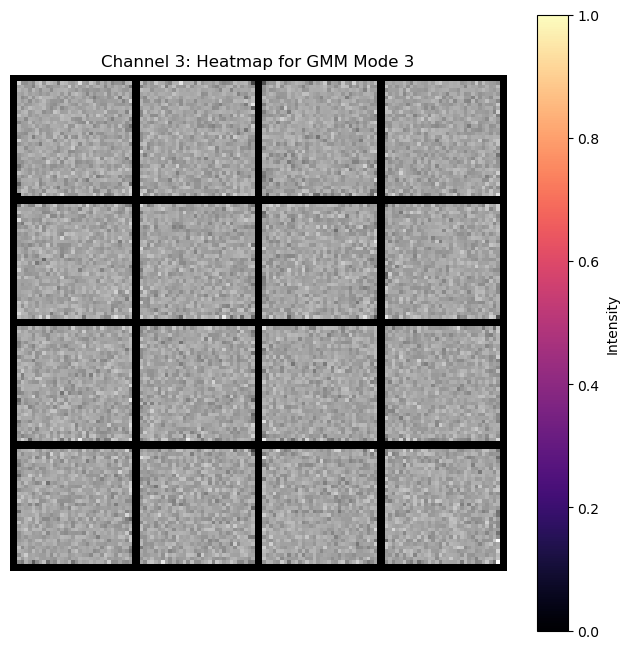

In [34]:
visualize_gmm_samples(samples, test_cfg)

In [36]:
import matplotlib.pyplot as plt
import torchvision
import torch

def display_gmm_heatmaps_v2(batch_tensor, nrow=8, padding=4):
    """
    Displays GMM heatmaps with clear spacing between images to evaluate 
    the spatial distribution of generated blobs.
    """
    # 1. Ensure input is 4D (B, C, H, W)
    if batch_tensor.dim() == 3:
        batch_tensor = batch_tensor.unsqueeze(1) # Add channel dim if missing

    # 2. Iterate through each channel (GMM Mode)
    # Each channel represents a unique Gaussian component from your GMM
    num_channels = batch_tensor.size(1)
    
    for i in range(num_channels):
        # Extract specific channel: shape (B, 1, H, W)
        channel_data = batch_tensor[:, i:i+1, :, :].detach().cpu()
        
        # Normalize for visualization: Mapping SDE outputs to [0, 1]
        c_min = channel_data.min()
        c_max = channel_data.max()
        channel_data = (channel_data - c_min) / (c_max - c_min + 1e-8)
        
        # Create the grid
        # pad_value=0.5 creates a neutral boundary to separate sparse blobs
        grid = torchvision.utils.make_grid(
            channel_data, 
            nrow=nrow, 
            padding=padding, 
            pad_value=0.5
        )
        
        # Convert to numpy for matplotlib (C, H, W) -> (H, W, C)
        grid_np = grid.permute(1, 2, 0).numpy()
        
        # Since it's a single-channel grid, we take one slice for the colormap
        plt.figure(figsize=(12, 12))
        plt.imshow(grid_np[:, :, 0], cmap='hot')
        plt.colorbar(label="Intensity")
        plt.title(f"GMM Mode Heatmap: Channel {i} (Padding={padding})")
        plt.axis('off')
        plt.show()

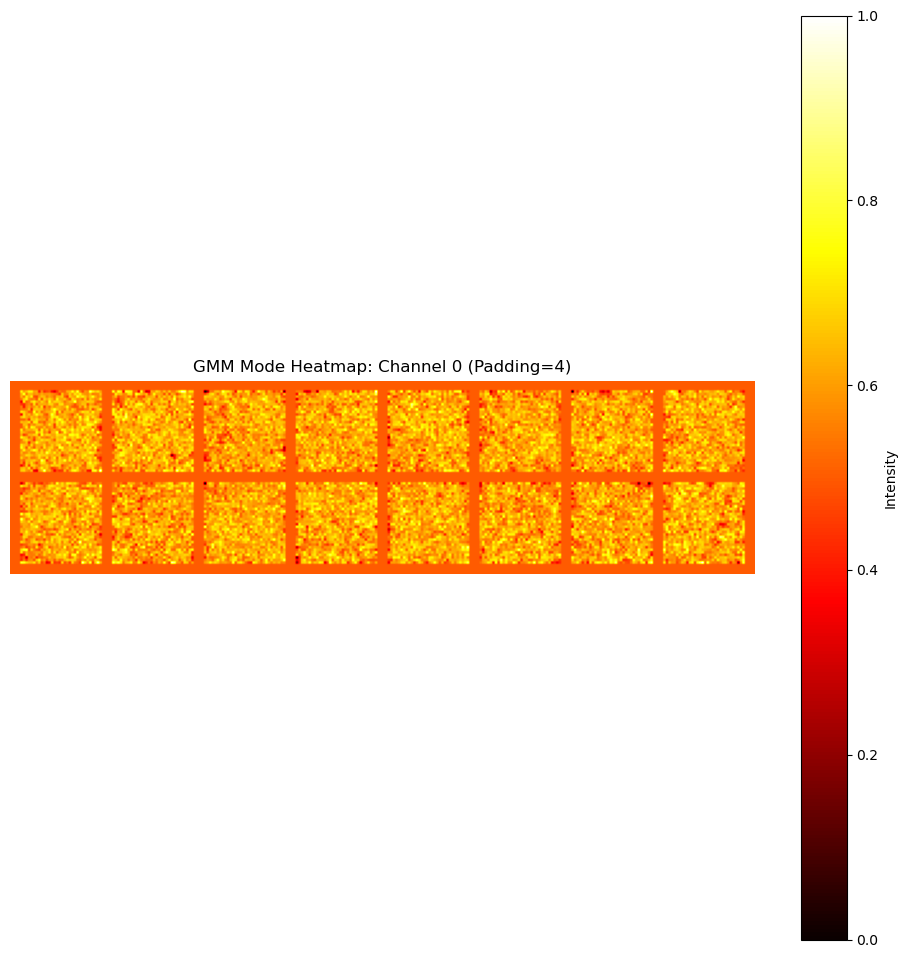

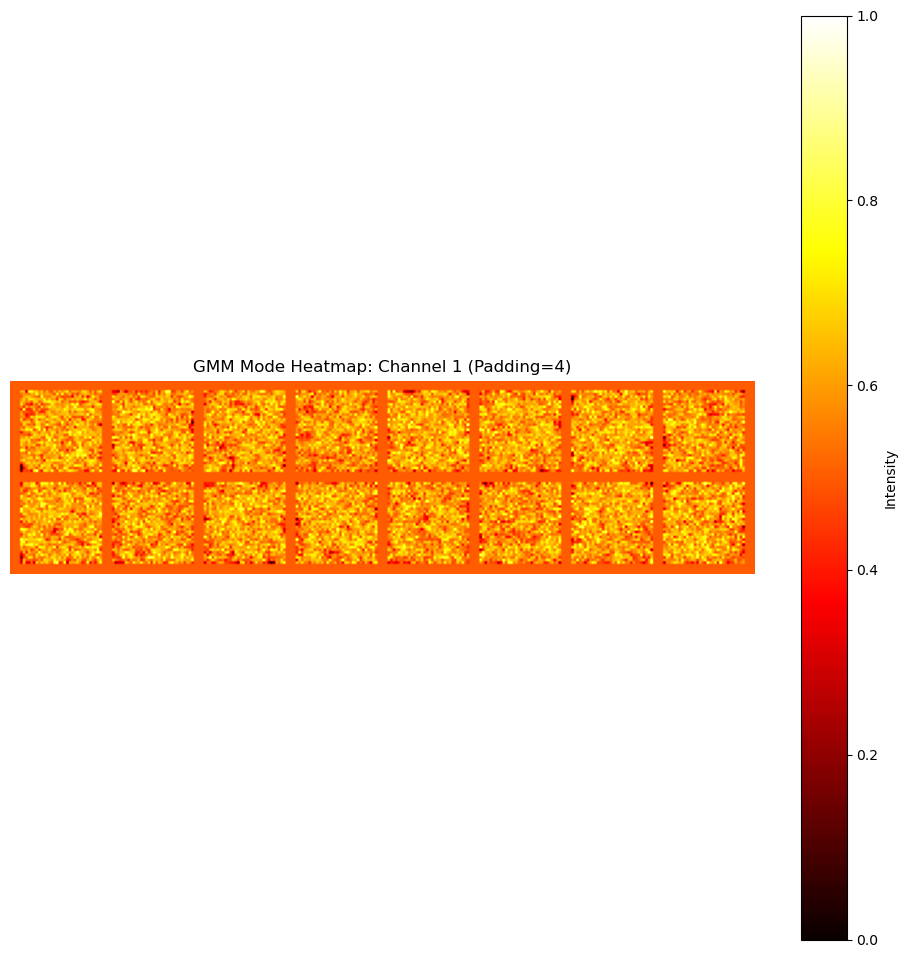

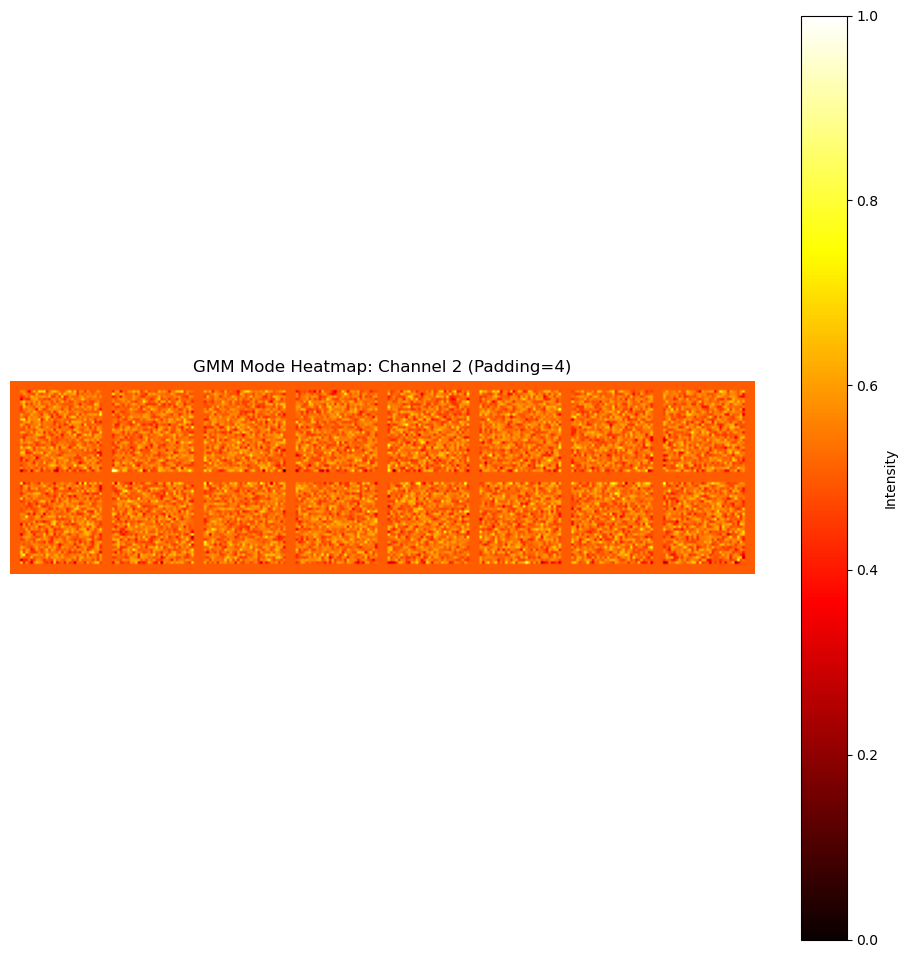

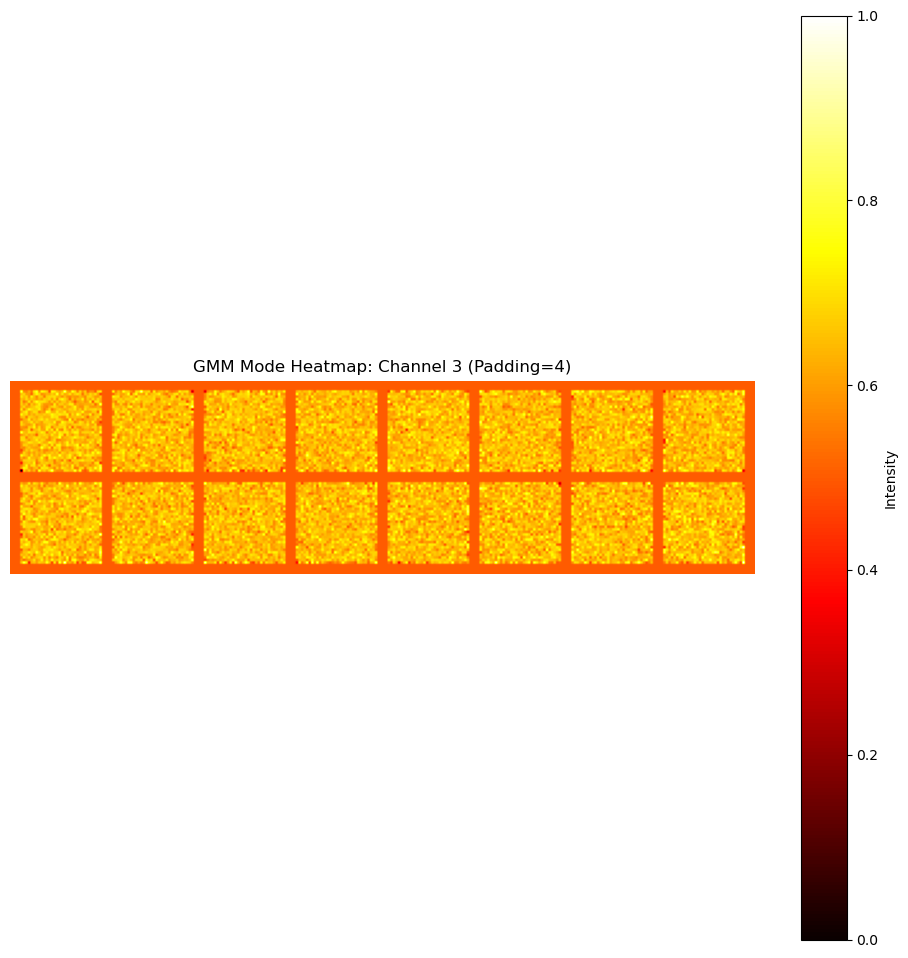

In [37]:
display_gmm_heatmaps_v2(samples)